# Adversarial example generation using Fast Gradient Sign method

https://savan77.github.io/blog/imagenet_adv_examples.html

## Load the model we want to fool --> Inception V3 in this case.

In [29]:
from torchvision.models import inception_v3
model = inception_v3(pretrained=True)
model.eval()

n_params = sum(p.numel() for p in model.parameters())
print(f'{n_params:,} parameters') # 27,161,264 parameters

27,161,264 parameters


## Download imagenet classes

In [23]:
!wget https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt

--2021-06-27 17:28:28--  https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10472 (10K) [text/plain]
Saving to: ‘imagenet_classes.txt.2’

imagenet_classes.tx 100%[===================>]  10.23K  --.-KB/s    in 0.002s  

2021-06-27 17:28:28 (5.80 MB/s) - ‘imagenet_classes.txt.2’ saved [10472/10472]



## Generate map class index --> class name

In [3]:
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]
    
id2label = {}
label2id = {}
for idx, category in enumerate(categories):
    id2label[idx] = category
    
id2label

{0: 'tench',
 1: 'goldfish',
 2: 'great white shark',
 3: 'tiger shark',
 4: 'hammerhead',
 5: 'electric ray',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich',
 10: 'brambling',
 11: 'goldfinch',
 12: 'house finch',
 13: 'junco',
 14: 'indigo bunting',
 15: 'robin',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel',
 21: 'kite',
 22: 'bald eagle',
 23: 'vulture',
 24: 'great grey owl',
 25: 'European fire salamander',
 26: 'common newt',
 27: 'eft',
 28: 'spotted salamander',
 29: 'axolotl',
 30: 'bullfrog',
 31: 'tree frog',
 32: 'tailed frog',
 33: 'loggerhead',
 34: 'leatherback turtle',
 35: 'mud turtle',
 36: 'terrapin',
 37: 'box turtle',
 38: 'banded gecko',
 39: 'common iguana',
 40: 'American chameleon',
 41: 'whiptail',
 42: 'agama',
 43: 'frilled lizard',
 44: 'alligator lizard',
 45: 'Gila monster',
 46: 'green lizard',
 47: 'African chameleon',
 48: 'Komodo dragon',
 49: 'African crocodile',
 50: 'American alligator',
 51: 'triceratops',
 

## Load the original image we want to modify

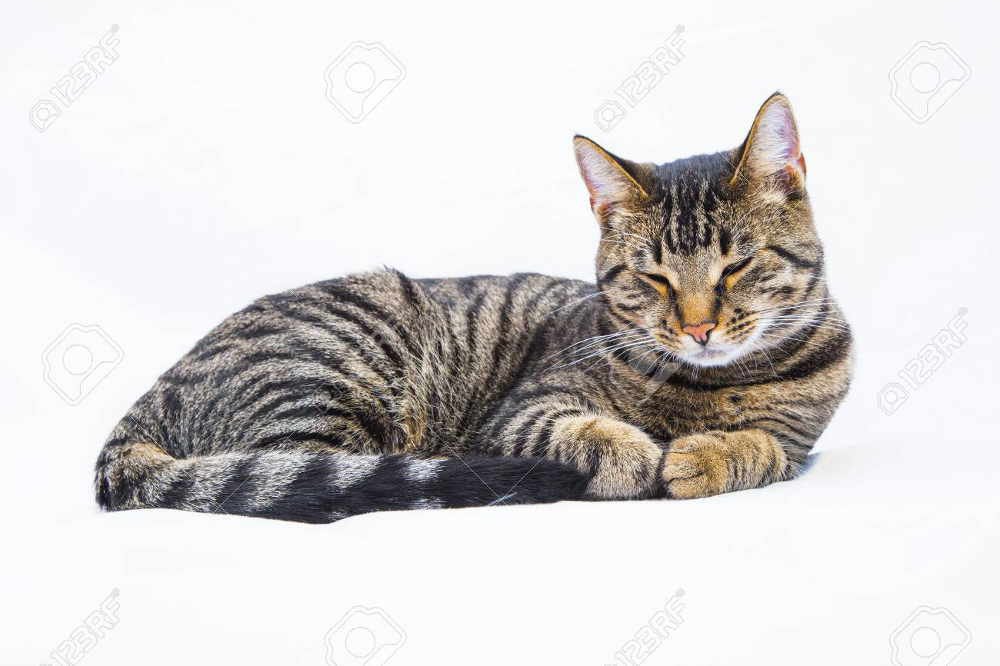

In [6]:
import requests
import io
from PIL import Image

url = 'https://previews.123rf.com/images/meinzahn/meinzahn1211/meinzahn121100339/16350068-cute-tiger-cat-isolated-on-white.jpg'
# url = 'https://gacetinmadrid.com/wp-content/uploads/2019/08/oso-panda-gigante.jpg' # panda

response = requests.get(url)
img = Image.open(io.BytesIO(response.content))
img

## Pre-process the image

In [8]:
import torch
from torch import Tensor
from torchvision import transforms

def preprocess(img) -> Tensor:
    """
    Inception V3 model from pytorch expects input images with pixel values between -1 and 1
    and dimensions 299 x 299
    """
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    preprocess_fn = transforms.Compose([
        transforms.Resize((299,299)),  
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ])
    image_tensor = preprocess_fn(img)

    # add batch dimension: C x H x W ==> B x C x H x W
    image_tensor = image_tensor.unsqueeze(0)
    
    return image_tensor

def inverse_preprocess(x: Tensor):
    """"""
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    return x.mul(torch.FloatTensor(std).view(3,1,1)).add(torch.FloatTensor(mean).view(3,1,1)).numpy()
    
    
x = preprocess(img)

## Check model prediction is OK

In [10]:
from easydict import EasyDict
import torch.nn.functional as F

def get_predictions(img: Tensor) -> EasyDict:

    output = model.forward(img)

    class_idx = torch.max(output.data, 1)[1][0].item()

    label = id2label[class_idx]

    output_probs = F.softmax(output, dim=1)
    confidence =  round(torch.max(output_probs.data, 1)[0][0].item(), 4)
    
    return EasyDict(
        id=class_idx,
        label=label,
        confidence=confidence,
    )

get_predictions(x)

{'id': 281, 'label': 'tabby', 'confidence': 0.8219}

## Fast gradient sign method

In [14]:
from typing import Tuple
from torch.autograd import Variable

def fast_gradient_sign(x: Tensor, eps: float) -> Tuple[Tensor, Tensor]:
    """"""
    # convert tensor into a variable, because we will need to compute gradients
    # of the loss function with respect to the image pixels
    img_variable = Variable(x, requires_grad=True)
    
    # forward pass on the original image
    output = model.forward(img_variable)
    
    # get predicted class
    y_true = torch.max(output.data, 1)[1][0].item()   
    target = Variable(torch.LongTensor([y_true]), requires_grad=False)
    
    # backward pass to compute gradients
    loss_fn = torch.nn.CrossEntropyLoss()
    loss = loss_fn(output, target)
    
    # this will calculate gradient of each variable (with requires_grad=True)
    # and you can later get access it with "var.grad.data"
    loss.backward(retain_graph=True)
    
    # sign of gradient of the loss func (with respect to input X)
    x_grad = torch.sign(img_variable.grad.data)
    
    # FGSM formula
    x_adversarial = img_variable.data + eps * x_grad
        
    return x_adversarial, x_grad

## Auxiliary function to visualize images and gradients

In [17]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def visualize(x, x_adv, x_grad, epsilon):
    """"""
    # get predicted label and confidence of x
    x_predictions = get_predictions(x)
    x_label = x_predictions.label
    x_prob = x_predictions.confidence
    
    # get predicted label and confidence of x_adv
    x_adv_predictions = get_predictions(x_adv)
    x_adv_label = x_adv_predictions.label
    x_adv_prob = x_adv_predictions.confidence

    # transform x into its raw form for visualization
    x = x.squeeze(0) # remove batch dimension: B x C x H x W ==> C x H x W
    x = inverse_preprocess(x)
    x = np.transpose( x , (1,2,0)) # C x H x W ==> H x W x C
    x = np.clip(x, 0, 1)
    
    # transform x_adv into its raw form for visualization
    x_adv = x_adv.squeeze(0)
    x_adv = inverse_preprocess(x_adv)
    x_adv = np.transpose( x_adv , (1,2,0))   # C X H X W  ==>   H X W X C
    x_adv = np.clip(x_adv, 0, 1)
    
    # transform grad into its raw form for visualization
    x_grad = x_grad.squeeze(0).numpy()
    x_grad = np.transpose(x_grad, (1,2,0))
    x_grad = np.clip(x_grad, 0, 1)
        
    # ----------------
    # start plotting
    # ----------------
    figure, ax = plt.subplots(1,3, figsize=(18,8))
    ax[0].imshow(x)
    ax[0].set_title('Clean Example', fontsize=20)
    
    ax[1].imshow(x_grad)
    ax[1].set_title('Perturbation', fontsize=20)
    ax[1].set_yticklabels([])
    ax[1].set_xticklabels([])
    ax[1].set_xticks([])
    ax[1].set_yticks([])

    
    ax[2].imshow(x_adv)
    ax[2].set_title('Adversarial Example', fontsize=20)
    
    ax[0].axis('off')
    ax[2].axis('off')

    ax[0].text(1.1,0.5, "+{}*".format(round(epsilon,3)), size=15, ha="center", 
             transform=ax[0].transAxes)
    
    ax[0].text(0.5,-0.13, "Prediction: {}\n Probability: {}".format(x_label, x_prob), size=15, ha="center", 
         transform=ax[0].transAxes)
    
    ax[1].text(1.1,0.5, " = ", size=15, ha="center", transform=ax[1].transAxes)

    ax[2].text(0.5,-0.13, "Prediction: {}\n Probability: {}".format(x_adv_label, x_adv_prob), size=15, ha="center", 
         transform=ax[2].transAxes)
    

    plt.show()

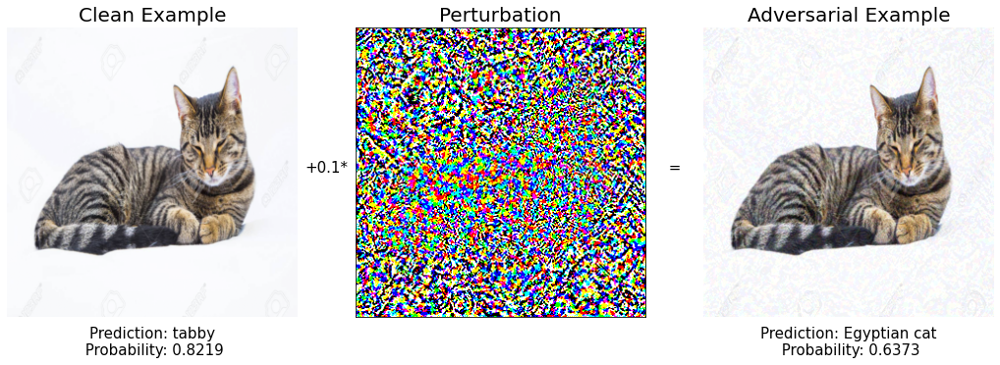

In [23]:
epsilon = 0.1
x_adv, grad = fast_gradient_sign(x, epsilon)
visualize(x, x_adv, grad, epsilon)

## Iterative fast gradient sign

In [19]:
def iterative_fast_gradient_sign(x_: Tensor, epsilon, n_steps, alpha):
    """"""
    x = x_.clone().detach()
    
    for step in range(n_steps):
                
        x_adv, grad = fast_gradient_sign(x, alpha)
        
        total_grad = x_adv - x_  # total perturbation
        total_grad = torch.clamp(total_grad, -epsilon, epsilon)
        x_adv = x_ + total_grad                      #add total perturbation to the original image
        
        print('Step ', step + 1)
        visualize(x, x_adv, grad, eps)
        
        x = x_adv
        
    return x_adv, total_grad

Step  1


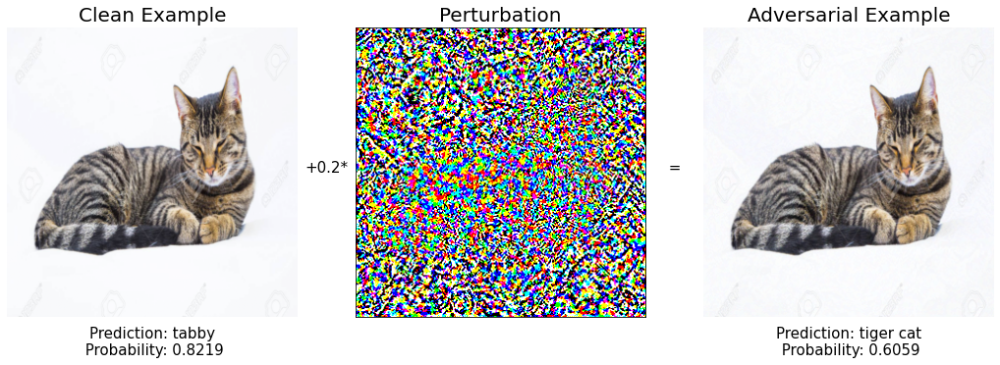

Step  2


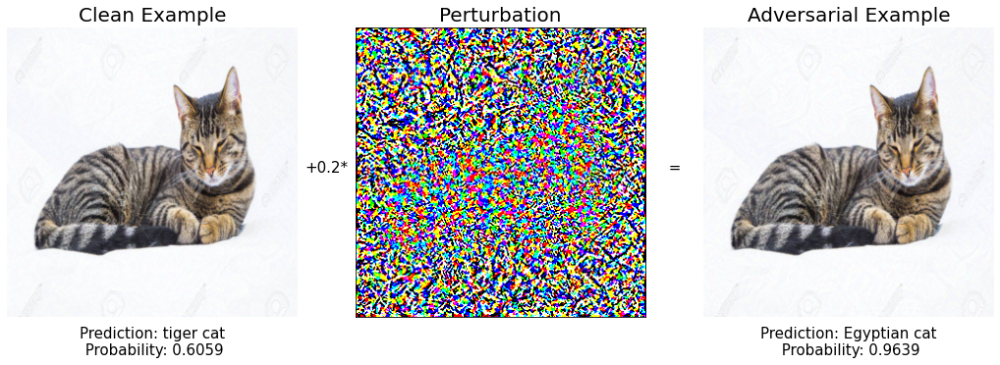

Step  3


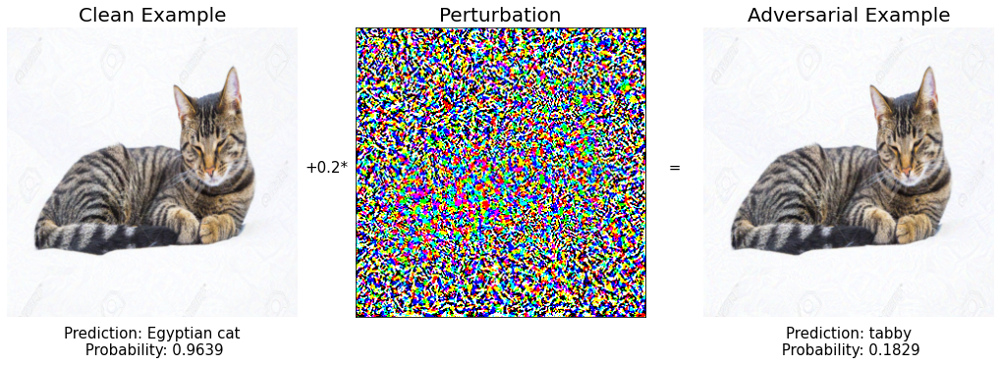

Step  4


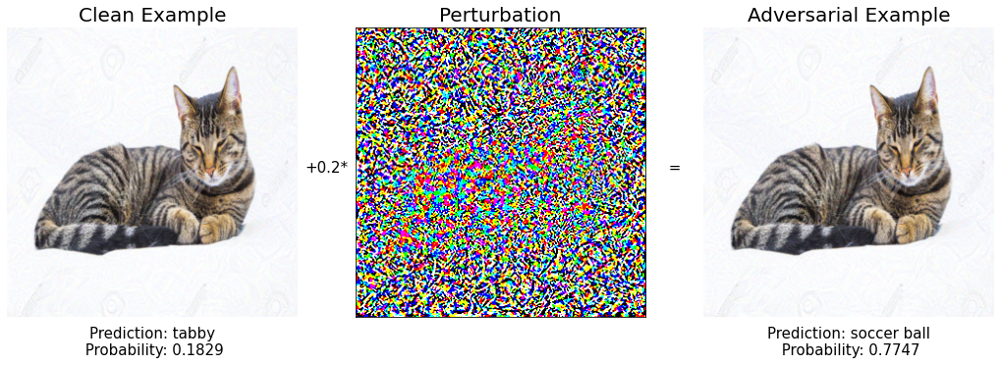

Step  5


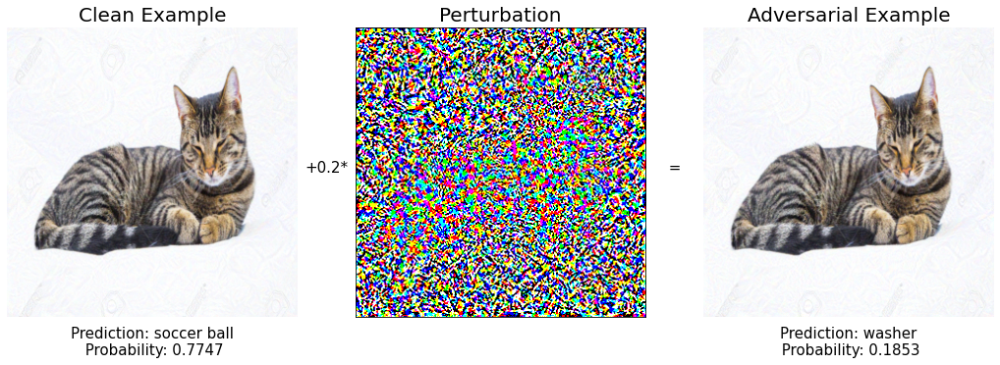

Step  6


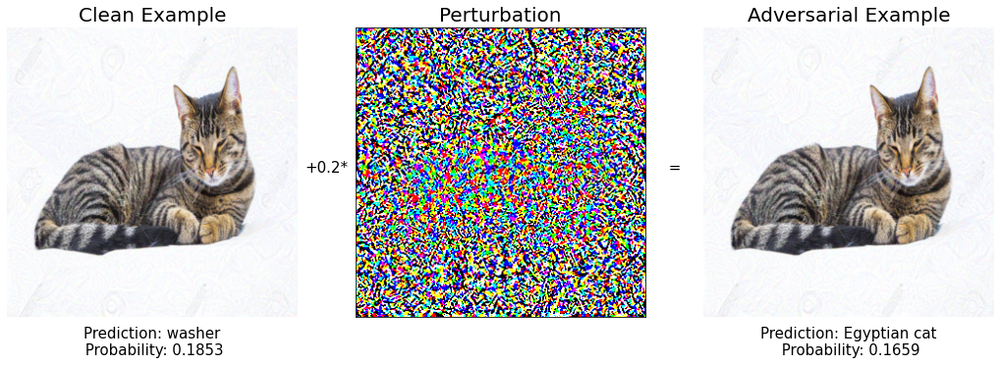

Step  7


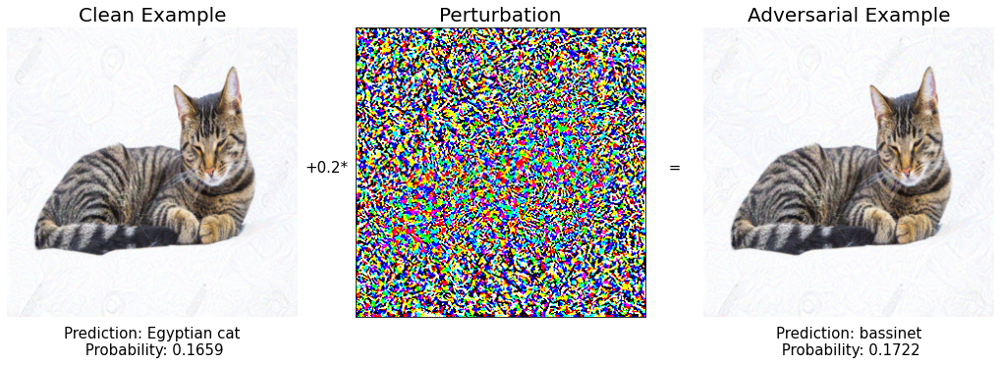

Step  8


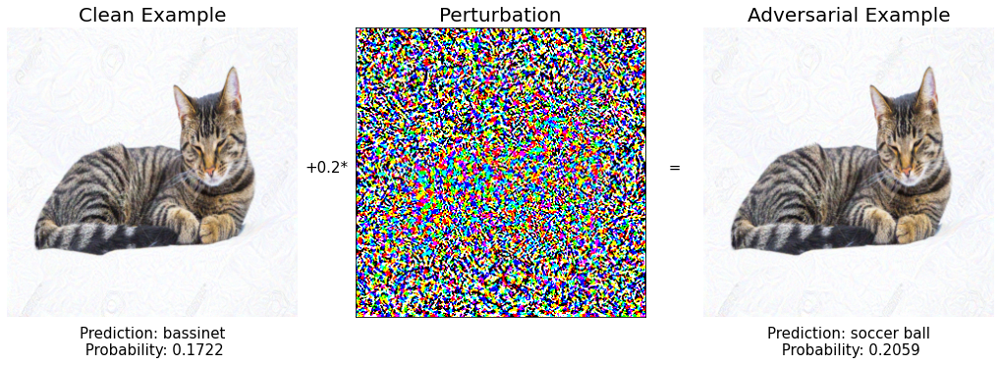

Step  9


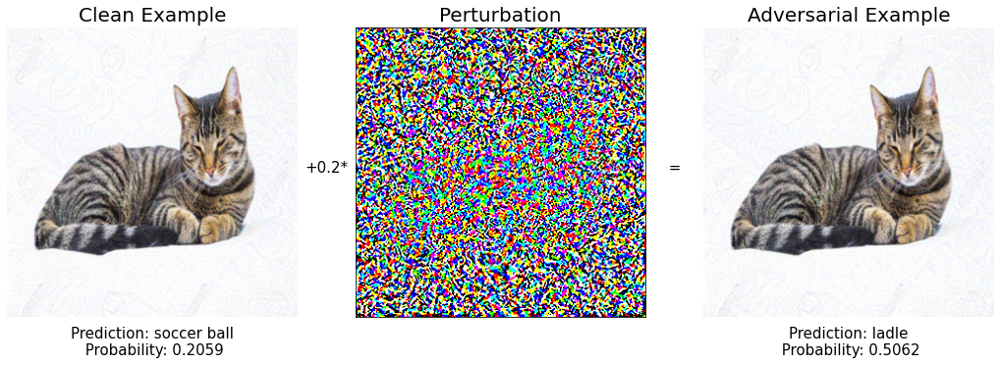

Step  10


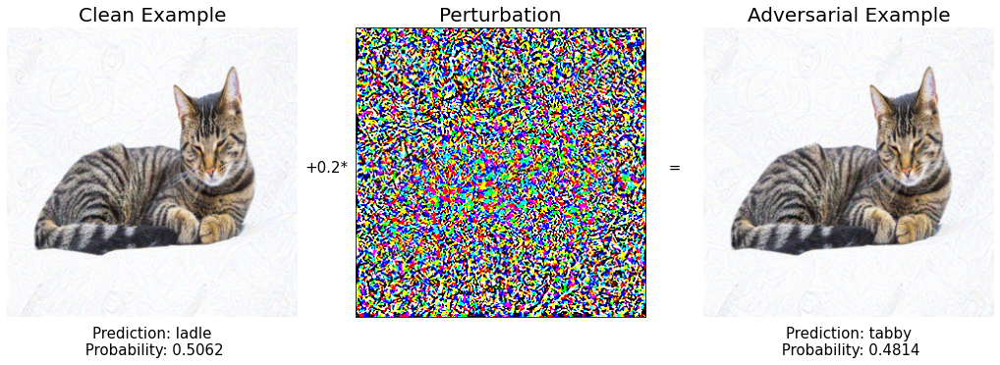

Step  11


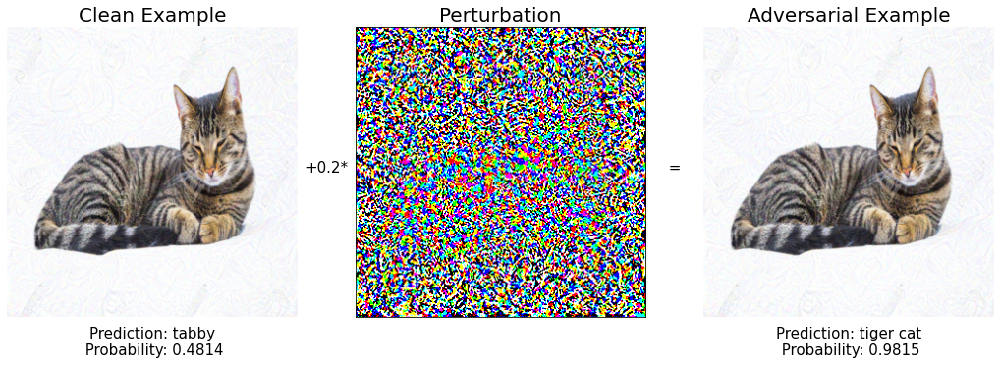

Step  12


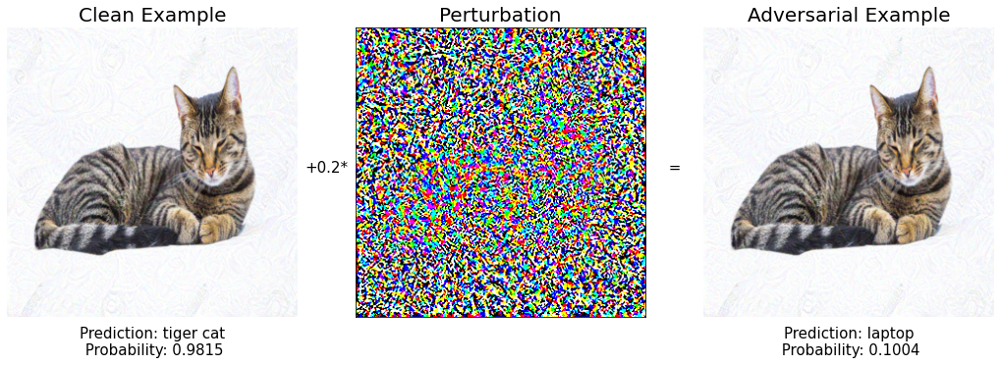

Step  13


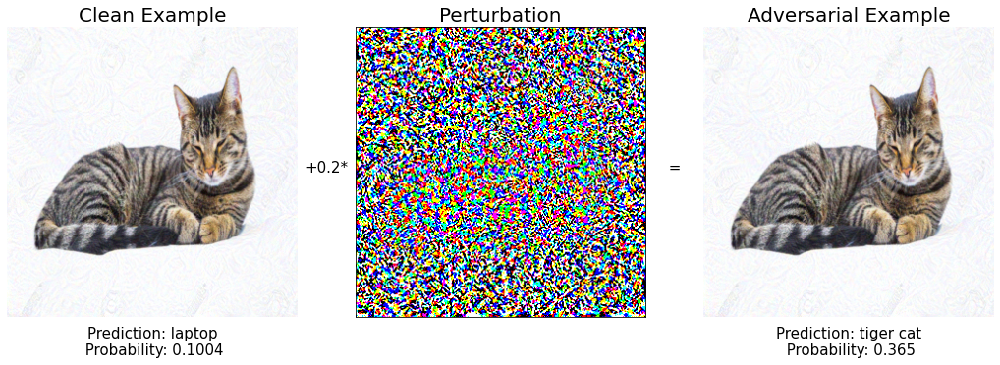

Step  14


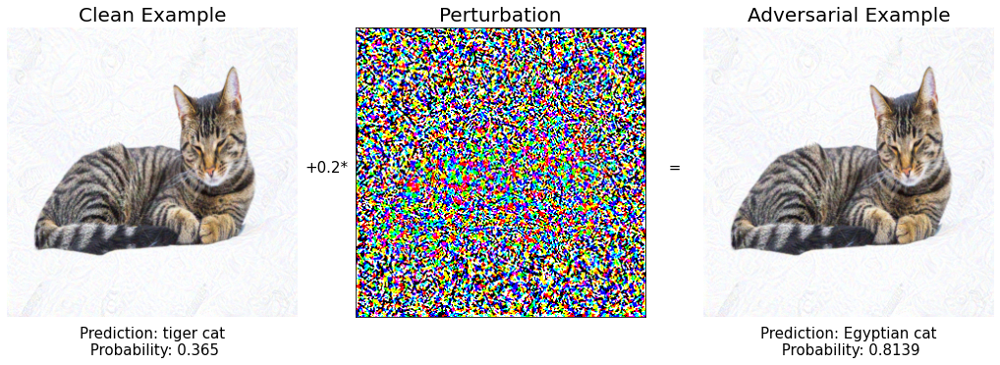

Step  15


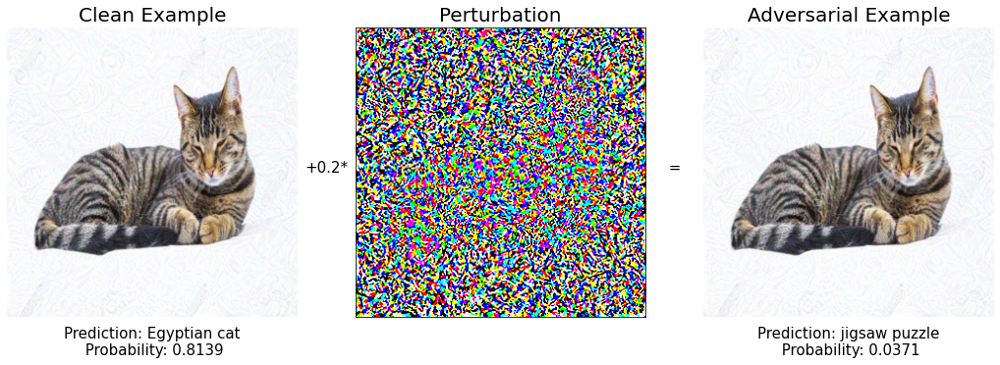

Step  16


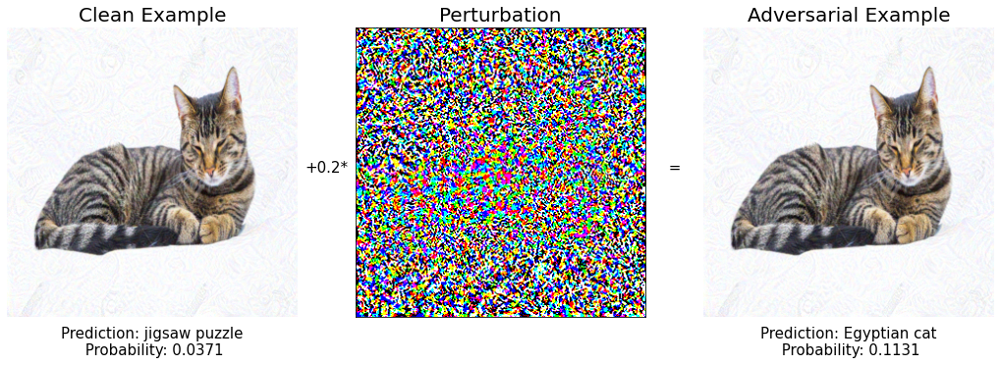

Step  17


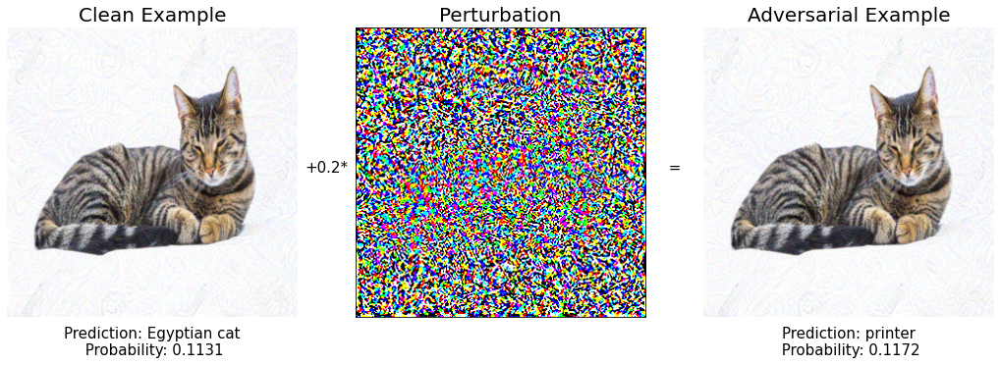

Step  18


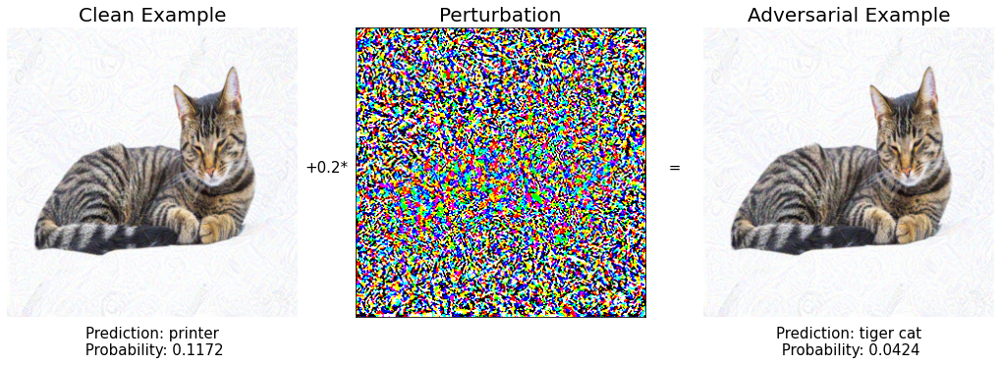

Step  19


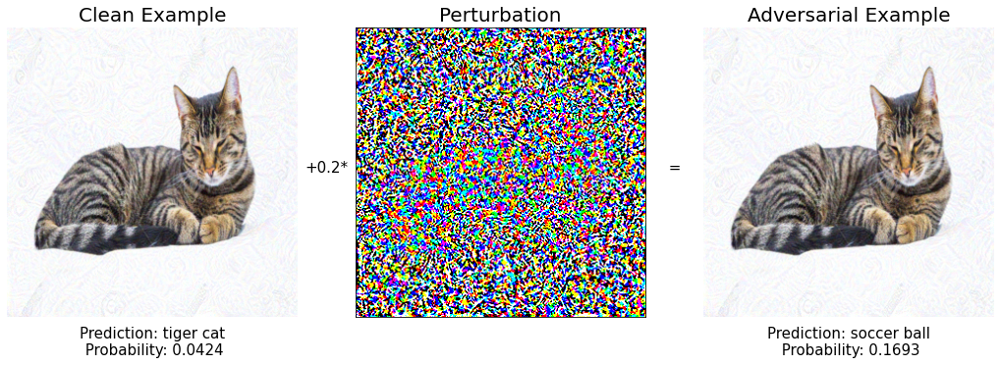

Step  20


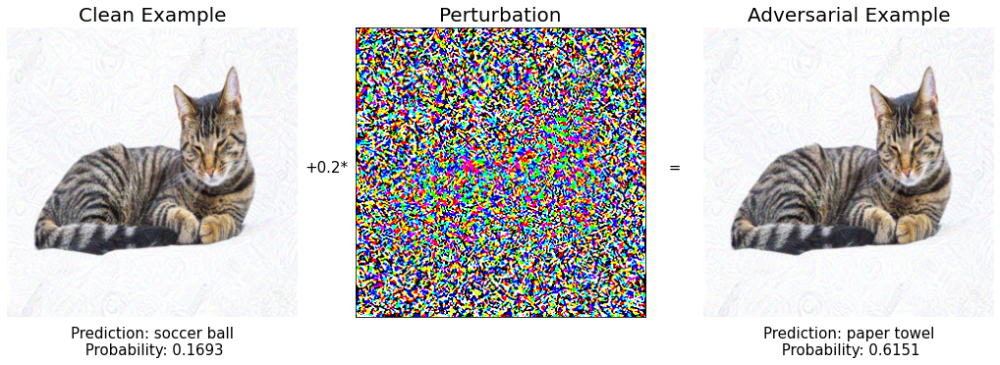

In [20]:
eps = 0.2
n_steps = 20
alpha = 0.025
x_adv, grad = iterative_fast_gradient_sign(x, eps, n_steps, alpha)